In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

In [2]:
train_set = pd.read_csv("http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data", header = None)
test_set = pd.read_csv("http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.test" , skiprows = 1, header = None)
col_labels = ["age","workclass", "fnlwgt","education","education_num","marital_status", "occupation","relationship", "race", "sex", "capital_gain","capital_loss", "hours_per_week", "native_country", "wage_class"]
train_set.columns = col_labels
test_set.columns = col_labels

In [3]:
train_set.occupation.unique()

array([' Adm-clerical', ' Exec-managerial', ' Handlers-cleaners',
       ' Prof-specialty', ' Other-service', ' Sales', ' Craft-repair',
       ' Transport-moving', ' Farming-fishing', ' Machine-op-inspct',
       ' Tech-support', ' ?', ' Protective-serv', ' Armed-Forces',
       ' Priv-house-serv'], dtype=object)

In [4]:
df = train_set

In [5]:
ProfileReport(train_set)

Summarize dataset:   0%|          | 0/28 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
df['education'] = df.education.replace(to_replace=['Bachelors', 'Some-college', '11th', 'HS-grad', 'Prof-school','Assoc-acdm', 'Assoc-voc', '9th', '7th-8th', '12th', 'Masters', '1st-4th', '10th', 'Doctorate', '5th-6th', 'Preschool'],value=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16] , regex= True )

In [7]:
df['sex'] = df.sex.replace(to_replace= ['Male' ,'Female'] , value= [1,2] , regex= True)
df['workclass'] = df.workclass.replace(to_replace=['Private', 'Self-emp-not-inc',' ?', 'Self-emp-inc', 'Federal-gov','Local-gov', 'State-gov', 'Without-pay', 'Never-worked'] , value  = [1,2,3,4,5,6,7,8,9],regex= True)
df['marital_status'] = df.marital_status.replace(to_replace=['Married-civ-spouse', 'Divorced', 'Never-married','Separated', 'Widowed', 'Married-spouse-absent', 'Married-AF-spouse'], value= [1,2,3,4,5,6,7] , regex= True)
df['occupation'] = df.occupation.replace(to_replace=['Tech-support',' ?', 'Craft-repair', 'Other-service', 'Sales', 'Exec-managerial', 'Prof-specialty', 'Handlers-cleaners', 'Machine-op-inspct','Adm-clerical', 'Farming-fishing', 'Transport-moving', 'Priv-house-serv','Protective-serv', 'Armed-Forces'] , value =[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15] , regex= True)
df['relationship'] = df.relationship.replace(to_replace=['Wife', 'Own-child', 'Husband', 'Not-in-family', 'Other-relative','Unmarried'],value=[1,2,3,4,5,6],regex= True)
df['race'] = df.race.replace(to_replace=['White', 'Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other', 'Black'] , value=[1,2,3,4,5],regex= True)
df['native_country'] = df.native_country.replace(to_replace = ['United-States', 'Cambodia', 'England','Puerto-Rico','Canada', 'Germany', ' Outlying-US(Guam-USVI-etc)', 'India',' ?', 'Japan','Greece', 'South', 'China', 'Cuba', 'Iran', 'Honduras', 'Philippines', 'Italy','Poland', 'Jamaica', 'Vietnam', 'Mexico', 'Portugal', 'Ireland', 'France','Dominican-Republic', 'Laos', 'Ecuador', 'Taiwan', 'Haiti', 'Columbia','Hungary', 'Guatemala', 'Nicaragua', 'Scotland', 'Thailand', 'Yugoslavia','El-Salvador', ' Trinadad&Tobago,' ' Peru', 'Hong', 'Holand-Netherlands'],value = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41] , regex = True )
df['wage_class'] = df.wage_class.replace(to_replace= ['>50K','<=50K'] , value= [1,2] , regex= True)

<AxesSubplot:>

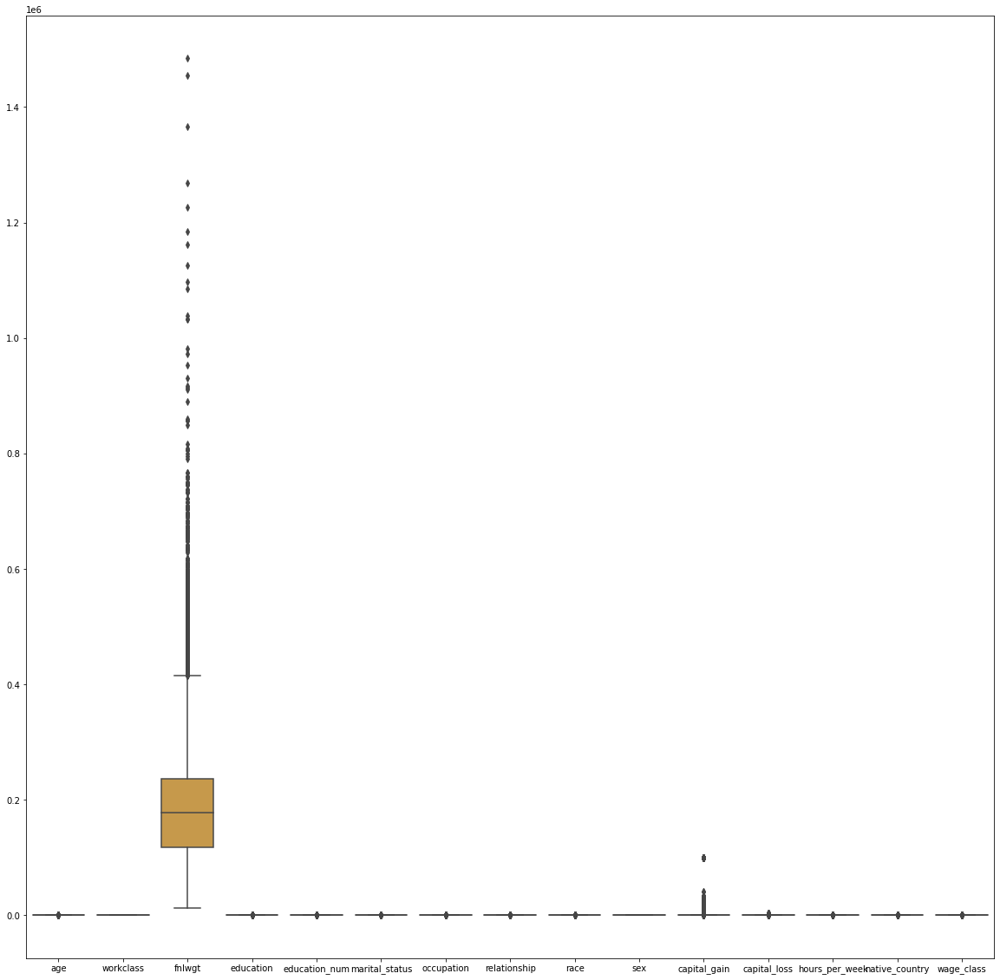

In [11]:
plt.subplots(figsize = (20,20))
sns.boxplot(data=df)

In [17]:
q = df['fnlwgt'].quantile(.8)
DTA_NEW = df[df['fnlwgt']<q]

<AxesSubplot:>

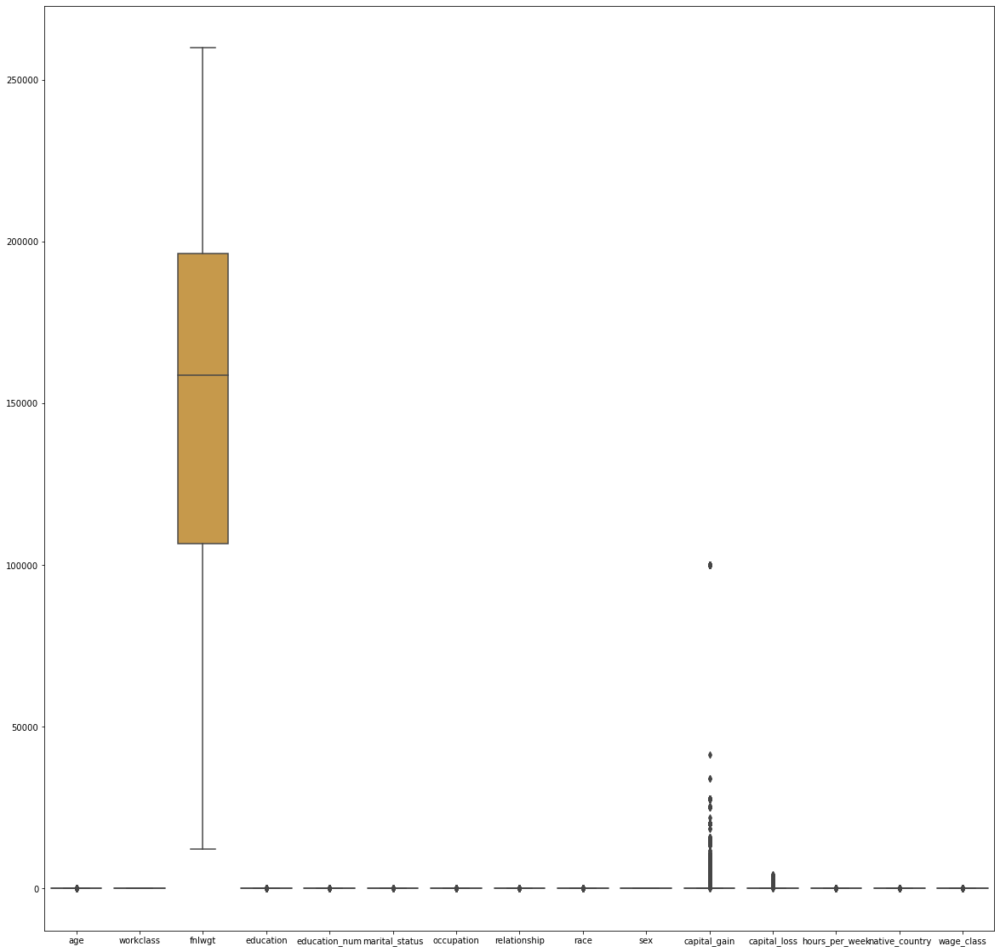

In [18]:
plt.subplots(figsize = (20,20))
sns.boxplot(data=DTA_NEW)

In [19]:
ProfileReport(DTA_NEW)

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [20]:
x = DTA_NEW.drop(columns= 'wage_class')
y = DTA_NEW['wage_class']

In [25]:
sd_sc = StandardScaler()
X = sd_sc.fit_transform(x)

In [26]:
xbgC = xgb.XGBClassifier()
xbgC.fit(X,y)

C:\ProgramData\Anaconda3\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[08:55:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=12, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [27]:
xbgC.score(X,y)

0.8973817567567568

In [28]:
xbgC.predict(sd_sc.transform([[49,1,160187,8,5,6,3,4,5,2,0,0,16,19]]))

array([2], dtype=int64)

In [29]:
df1 = test_set
df1['education'] = df1.education.replace(to_replace=['Bachelors', 'Some-college', '11th', 'HS-grad', 'Prof-school','Assoc-acdm', 'Assoc-voc', '9th', '7th-8th', '12th', 'Masters', '1st-4th', '10th', 'Doctorate', '5th-6th', 'Preschool'],value=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16] , regex= True )
df1['sex'] = df1.sex.replace(to_replace= ['Male' ,'Female'] , value= [1,2] , regex= True)
df1['workclass'] = df1.workclass.replace(to_replace=['Private', 'Self-emp-not-inc',' ?', 'Self-emp-inc', 'Federal-gov','Local-gov', 'State-gov', 'Without-pay', 'Never-worked'] , value  = [1,2,3,4,5,6,7,8,9],regex= True)
df1['marital_status'] = df1.marital_status.replace(to_replace=['Married-civ-spouse', 'Divorced', 'Never-married','Separated', 'Widowed', 'Married-spouse-absent', 'Married-AF-spouse'], value= [1,2,3,4,5,6,7] , regex= True)
df1['occupation'] = df1.occupation.replace(to_replace=['Tech-support',' ?', 'Craft-repair', 'Other-service', 'Sales', 'Exec-managerial', 'Prof-specialty', 'Handlers-cleaners', 'Machine-op-inspct','Adm-clerical', 'Farming-fishing', 'Transport-moving', 'Priv-house-serv','Protective-serv', 'Armed-Forces'] , value =[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15] , regex= True)
df1['relationship'] = df1.relationship.replace(to_replace=['Wife', 'Own-child', 'Husband', 'Not-in-family', 'Other-relative','Unmarried'],value=[1,2,3,4,5,6],regex= True)
df1['race'] = df1.race.replace(to_replace=['White', 'Asian-Pac-Islander', 'Amer-Indian-Eskimo', 'Other', 'Black'] , value=[1,2,3,4,5],regex= True)
df1['native_country'] = df1.native_country.replace(to_replace = ['United-States', 'Cambodia', 'England','Puerto-Rico','Canada', 'Germany', ' Outlying-US(Guam-USVI-etc)', 'India',' ?', 'Japan','Greece', 'South', 'China', 'Cuba', 'Iran', 'Honduras', 'Philippines', 'Italy','Poland', 'Jamaica', 'Vietnam', 'Mexico', 'Portugal', 'Ireland', 'France','Dominican-Republic', 'Laos', 'Ecuador', 'Taiwan', 'Haiti', 'Columbia','Hungary', 'Guatemala', 'Nicaragua', 'Scotland', 'Thailand', 'Yugoslavia','El-Salvador', ' Trinadad&Tobago,' ' Peru', 'Hong', 'Holand-Netherlands'],value = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41] , regex = True )
df1['wage_class'] = df1.wage_class.replace(to_replace= ['>50K','<=50K'] , value= [1,2] , regex= True)

In [32]:
test_x = df1.drop(columns= 'wage_class')
test_y = df1['wage_class']

In [33]:
xbgC.score(sd_sc.transform(test_x),test_y)

0.865118850193477

In [34]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

In [35]:
pred_y = xbgC.predict(sd_sc.transform(test_x))

In [36]:
confusion_matrix(test_y, pred_y)

array([[ 2404,  1442],
       [  754, 11681]], dtype=int64)

<AxesSubplot:>

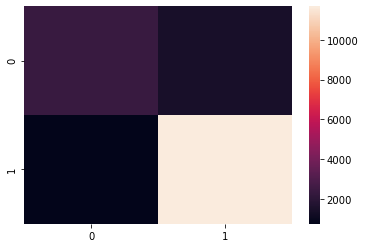

In [37]:
sns.heatmap(confusion_matrix(test_y, pred_y))

In [ ]:
test_y.unique()

In [38]:
import pickle


In [39]:
pickle.dump(xbgC,open('xgboost-assign.pickle', 'wb'))
pickle.dump(sd_sc,open('sd_sc_xgboost', 'wb'))

In [40]:
ls

 Volume in drive C is OS_Install
 Volume Serial Number is E88F-2898

 Directory of C:\Users\rohan

01-01-2022  08:58    <DIR>          .
25-12-2021  11:59    <DIR>          ..
25-08-2021  11:03    <DIR>          .anaconda
06-12-2021  21:01    <DIR>          .conda
25-08-2021  11:01                25 .condarc
25-08-2021  11:01    <DIR>          .continuum
02-09-2021  23:47    <DIR>          .cufflinks
24-12-2021  09:52    <DIR>          .docker
27-12-2021  11:11                81 .gitconfig
30-12-2021  17:41    <DIR>          .ipynb_checkpoints
28-08-2021  09:04    <DIR>          .ipython
21-09-2021  22:07    <DIR>          .jupyter
25-12-2021  13:36                20 .lesshst
08-12-2021  20:44    <DIR>          .matplotlib
01-10-2021  17:48    <DIR>          .vscode
07-12-2021  18:07               204 _netrc
25-11-2021  17:03           261,729 13 nov , xg boost and cluster.ipynb
30-12-2021  18:57        12,247,137 25 oct.ipynb
27-11-2021  08:55            14,607 27 nov.ipynb
24-08-2021

In [18]:
train_set.age.max()

90